In [ ]:
!pip install transformers
!pip install emoji
!pip install sentencepiece
!pip install nltk
!pip install emot==3.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 397.5/397.5 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.5/61.5 kB 1.6 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np

# visualization
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.decomposition import LatentDirichletAllocation
from collections import Counter
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.4f}'.format

import io
from datetime import timedelta

# nltk
import nltk
from nltk.corpus import stopwords
from  nltk.stem import SnowballStemmer
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

from transformers import AutoModelForSequenceClassification, AutoTokenizer, pipeline
import re
import emoji
from tqdm.notebook import tqdm
tqdm.pandas()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
path = 'earthquake_tweets.csv'


In [ ]:
df = pd.read_csv(path)

In [ ]:
df.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1624185742552403969,Gogoman,NaN,NaN,2012-12-26 12:08:27+00:00,369,2076.0000,99630.0000,False,2023-02-10 23:17:11+00:00,@simonkjaer1989 @acmilan @acmilanbr @acmilanar...,NaN,Twitter for Android,0.0000,0.0000,False
1,1624155272179580928,Crypto Dough Doe,"London, England",Get rich our die buying! $link,2019-11-13 23:30:36+00:00,1002,447.0000,3798.0000,False,2023-02-10 21:16:06+00:00,Hi People...any help here would be much apprec...,NaN,Twitter Web App,0.0000,0.0000,False
2,1624144833647415325,Eylem KILIÇ,NaN,⚕,2020-07-21 16:12:08+00:00,85,143.0000,2737.0000,False,2023-02-10 20:34:38+00:00,@JLo @intimissimi #TurkeyQuake we are in desp...,"['TurkeyQuake', 'AhbapDernegi', 'hatay', 'AFAD']",Twitter for Android,0.0000,0.0000,False
3,1624123056372187143,bee | tarlos 🎗,NaN,NaN,2018-03-24 12:03:03+00:00,0,6.0000,68704.0000,False,2023-02-10 19:08:06+00:00,thank you rafael this means a lot 😭😭😭💜 #Turkey...,"['TurkeyQuake', 'türkiye', 'deprem']",Twitter for iPhone,0.0000,0.0000,False
4,1624121846479061019,Ameya,India,Life lead by curiousity & mind filled with que...,2017-10-26 16:20:28+00:00,29,146.0000,106.0000,False,2023-02-10 19:03:17+00:00,@adgpi Hey @BBCWorld try to cover these storie...,['TurkeyQuake'],Twitter for iPhone,0.0000,0.0000,False


In [ ]:
import pandas as pd
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
nltk.download('stopwords')


# NaN değerleri boş bir dizeyle doldur
df['text'].fillna("", inplace=True)

# Verileri nümerik ifadelerden arındırma
df['text'] = df['text'].replace('[^a-zA-Z]', ' ', regex=True)

# Verileri özel karakterlerden ve noktalama işaretlerinden arındırma
df['text'] = df['text'].apply(lambda x: re.sub(r'[^\w\s]', '', str(x)))

# Verileri gereksiz kelimelerden (stopwords) arındırma
stop_words = set(stopwords.words('english'))
df['text'] = df['text'].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word.lower() not in stop_words]))

# Verilerin tamamını küçük harfe çevirme
df['text'] = df['text'].apply(lambda x: x.lower())

# Verilerin seçilen konuyla ilişkilerini kontrol edecek şekilde, ilişkisiz cümlelerden arındırma
related_keywords = ['earthquake', 'turkeyquake', 'syria', 'help', 'donate']
df = df[df['text'].apply(lambda x: any(keyword in x for keyword in related_keywords))]

# Ön işleme sonrası veriyi göster
print(df)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


                        id                   user_name      user_location  \
1      1624155272179580928            Crypto Dough Doe    London, England   
2      1624144833647415325                 Eylem KILIÇ                NaN   
3      1624123056372187143              bee | tarlos 🎗                NaN   
4      1624121846479061019                       Ameya              India   
5      1624115816815009792             M.d Jewell Azad  Darjeeling, India   
...                    ...                         ...                ...   
28838  1629149942999662592              𝕽𝖔𝖇 ☘ ᚏᚑᚔᚁᚓᚐᚏᚇ   Northern Ireland   
28840  1629143368348364806      Athens Democracy Forum    Athens, Greece    
28841  1629143010817482753  Raindrop Foundation Austin                NaN   
28842  1629134382584807425                 محب الأمطار                NaN   
28843  1629133507615137794                Mifrah Ahmad                NaN   

                                        user_description  \
1              

In [ ]:
def info(dataframe):
    print('Dataset size :', df.shape)
    print("# -------------------------------------------- #", "\n")
    print('Shape :', df.info())
    print("# -------------------------------------------- #", "\n")
    print('Shape :', df.describe())
    print("# -------------------------------------------- #", "\n")
    buf = io.StringIO()
    pd.read_csv(path).info(buf=buf)
    info = buf.getvalue().split('\n')[-2].split(":")[1].strip()
    print('Memory usage : ', info)
    print("# -------------------------------------------- #", "\n")

info(df)

Dataset size : (28844, 16)
# -------------------------------------------- # 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28844 entries, 0 to 28843
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                28844 non-null  object 
 1   user_name         28841 non-null  object 
 2   user_location     20767 non-null  object 
 3   user_description  26247 non-null  object 
 4   user_created      28844 non-null  object 
 5   user_followers    28844 non-null  object 
 6   user_friends      28843 non-null  float64
 7   user_favourites   28843 non-null  float64
 8   user_verified     28843 non-null  object 
 9   date              28843 non-null  object 
 10  text              28843 non-null  object 
 11  hashtags          17866 non-null  object 
 12  source            28842 non-null  object 
 13  retweets          28842 non-null  float64
 14  favorites         28842 non-null  float64
 15  is_retwee

In [ ]:
df['source'].value_counts().head()

Twitter for Android    6623
Twitter Web App        6496
Twitter for iPhone     5014
TweetDeck               516
Twitter for iPad        235
Name: source, dtype: int64

In [ ]:
df['date'] = pd.to_datetime(df['date'])
df['date'] = df['date'].dt.date
df.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
1,1624155272179580928,Crypto Dough Doe,"London, England",Get rich our die buying! $link,2019-11-13 23:30:36+00:00,1002,447.0000,3798.0000,False,2023-02-10,hi people help would much appreciated quick le...,NaN,Twitter Web App,0.0000,0.0000,False
2,1624144833647415325,Eylem KILIÇ,NaN,⚕,2020-07-21 16:12:08+00:00,85,143.0000,2737.0000,False,2023-02-10,jlo intimissimi turkeyquake desperate please h...,"['TurkeyQuake', 'AhbapDernegi', 'hatay', 'AFAD']",Twitter for Android,0.0000,0.0000,False
3,1624123056372187143,bee | tarlos 🎗,NaN,NaN,2018-03-24 12:03:03+00:00,0,6.0000,68704.0000,False,2023-02-10,thank rafael means lot turkeyquake rkiye depre...,"['TurkeyQuake', 'türkiye', 'deprem']",Twitter for iPhone,0.0000,0.0000,False
4,1624121846479061019,Ameya,India,Life lead by curiousity & mind filled with que...,2017-10-26 16:20:28+00:00,29,146.0000,106.0000,False,2023-02-10,adgpi hey bbcworld try cover stories absolute ...,['TurkeyQuake'],Twitter for iPhone,0.0000,0.0000,False
5,1624115816815009792,M.d Jewell Azad,"Darjeeling, India",https://t.co/MF4oRSy7we,2020-09-30 19:52:36+00:00,81,47.0000,3440.0000,False,2023-02-10,picture day turkeyquake syrianeedshelp helpsyr...,"['TurkeyQuake', 'SyriaNeedsHelp', 'helpSyrianP...",Twitter for Android,0.0000,1.0000,False


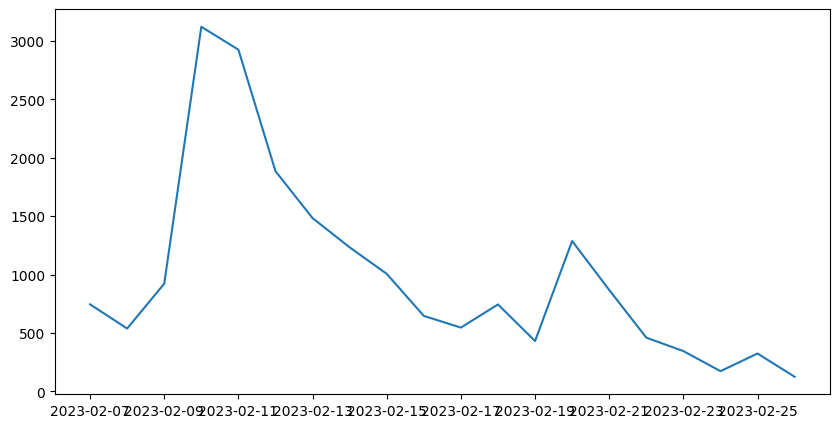

In [ ]:
# tweeting trend by day
df['date'].value_counts().plot(figsize=(10,5));

In [ ]:
df.shape

(19807, 16)

In [ ]:
# remove duplicate tweets
df.drop_duplicates('text', inplace=True)
df.shape

(18912, 18)

In [ ]:
def preprocess_word(word):

    # Convert more than 2 letter repetitions to 2 letter
    word = re.sub(r'(.)\1+', r'\1\1', word)
    # Remove - & '
    word = re.sub(r'(-|\')', '', word)
    return word

def is_valid_word(word):
    # Check the validity of the word according to the Turkish alphabet
    return (re.search(r'^[a-zA-Z0-9ğüışöçIİĞÜŞÖÇ]+$', word) is not None)

def remove_emoji(tweet):

  # Positive emojis
  tweet = re.sub(r'(:\s?\)|:-\)|\(\s?:|\(-:|:\'\)|:\s?D|:-D|x-?D|X-?D|<3|:\*)', '', tweet)
  # Negative emojis
  tweet = re.sub(r'(;-?\)|;-?D|\(-?;)|:\s?\(|:-\(|\)\s?:|\)-:|:,\(|:\'\(|:"\(', '', tweet)

  emoji_pattern = re.compile(
    '['
    u'\U0001F600-\U0001F64F'  # emoticons
    u'\U0001F300-\U0001F5FF'  # symbols & pictographs
    u'\U0001F680-\U0001F6FF'  # transport & map symbols
    u'\U0001F1E0-\U0001F1FF'  # flags (iOS)
    u'\U00002702-\U000027B0'
    u'\U000024C2-\U0001F251'
    ']+',
    flags=re.UNICODE)

  tweet = emoji_pattern.sub(r'', tweet)

  return tweet

def preprocess_tweet(tweet):
    processed_tweet = []
    # Convert to lower case
    tweet = tweet.lower()

    #Clean only digits
    tweet = re.sub("^\d+\s|\s\d+\s|\s\d+$", " ", tweet)

    # Remove URLs, user mentions and hashtags
    tweet = re.sub(r'((www\.[\S]+)|(https?://[\S]+)|(@[\S]+)|(#(\S+)))', '', tweet)

    # Remove RT (retweet)
    tweet = re.sub(r'\brt\b', '', tweet)

    # Replace 2+ dots with space
    tweet = re.sub(r'\.{2,}', ' ', tweet)

    # Strip space, " and ' from tweet
    tweet = tweet.strip(' "\'')

    #remove emojis
    tweet = remove_emoji(tweet)

    # Replace multiple spaces with a single space
    tweet = re.sub(r'\s+', ' ', tweet)
    words = tweet.split()

    for word in words:
      word = preprocess_word(word)
      if is_valid_word(word):
        processed_tweet.append(word)

    return ' '.join(processed_tweet)

In [ ]:
# remove duplicate tweets
df.drop_duplicates('text', inplace=True)
df.shape

(18916, 16)

In [ ]:
df["text"] = df.text.map(preprocess_tweet)

In [ ]:
df.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
1,1624155272179580928,Crypto Dough Doe,"London, England",Get rich our die buying! $link,2019-11-13 23:30:36+00:00,1002,447.0000,3798.0000,False,2023-02-10,hi people help would much appreciated quick le...,NaN,Twitter Web App,0.0000,0.0000,False
2,1624144833647415325,Eylem KILIÇ,NaN,⚕,2020-07-21 16:12:08+00:00,85,143.0000,2737.0000,False,2023-02-10,jlo intimissimi turkeyquake desperate please h...,"['TurkeyQuake', 'AhbapDernegi', 'hatay', 'AFAD']",Twitter for Android,0.0000,0.0000,False
3,1624123056372187143,bee | tarlos 🎗,NaN,NaN,2018-03-24 12:03:03+00:00,0,6.0000,68704.0000,False,2023-02-10,thank rafael means lot turkeyquake rkiye depre...,"['TurkeyQuake', 'türkiye', 'deprem']",Twitter for iPhone,0.0000,0.0000,False
4,1624121846479061019,Ameya,India,Life lead by curiousity & mind filled with que...,2017-10-26 16:20:28+00:00,29,146.0000,106.0000,False,2023-02-10,adgpi hey bbcworld try cover stories absolute ...,['TurkeyQuake'],Twitter for iPhone,0.0000,0.0000,False
5,1624115816815009792,M.d Jewell Azad,"Darjeeling, India",https://t.co/MF4oRSy7we,2020-09-30 19:52:36+00:00,81,47.0000,3440.0000,False,2023-02-10,picture day turkeyquake syrianeedshelp helpsyr...,"['TurkeyQuake', 'SyriaNeedsHelp', 'helpSyrianP...",Twitter for Android,0.0000,1.0000,False


In [ ]:
# We'll use a model based on the bilingual language model
model = AutoModelForSequenceClassification.from_pretrained("cardiffnlp/twitter-xlm-roberta-base-sentiment")
tokenizer = AutoTokenizer.from_pretrained("cardiffnlp/twitter-xlm-roberta-base-sentiment")
sa = pipeline("sentiment-analysis", tokenizer=tokenizer, model=model)

config.json:   0%|          | 0.00/841 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.11G [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

In [ ]:
pre_twit = preprocess_tweet(df.loc[1200].text)
print(pre_twit)
p = sa(pre_twit)
print(p)

turkish government people biggest racists earth syria earthquake turkeyearthquake
[{'label': 'negative', 'score': 0.8908741474151611}]


In [ ]:
def get_sentiment_analysis(tweet):
    """True if tweet has positive compound sentiment, False otherwise."""
    p = sa(str(tweet))  # sa pipeline
    return pd.Series([p[0]["label"], round(p[0]["score"],4)])

In [ ]:
get_sentiment_analysis(df['text'])

0    negative
1      0.3458
dtype: object

In [ ]:
df["sentiment_label"] = "-"
df["sentiment_score"] = -1
df[["sentiment_label", "sentiment_score"]] = df["text"].progress_apply(get_sentiment_analysis)

  0%|          | 0/18916 [00:00<?, ?it/s]

In [ ]:
temp = df.groupby('sentiment_label').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment_label,text
0,negative,9731
1,neutral,8308
2,positive,877


In [ ]:
df['sentiment_score'].apply(lambda x: float(x)).head()

1   0.3555
2   0.5636
3   0.3589
4   0.5059
5   0.4214
Name: sentiment_score, dtype: float64

In [ ]:
df_positive = df[df["sentiment_label"]=="positive"]
df_positive.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet,sentiment_label,sentiment_score
142,1623115572580941826,𝙍𝙚𝙨-𝙋𝙚𝙘𝙏𝙧𝙪𝙩𝙝,United Kingdom,"Seni Olumede Goturse , Dogruluktan Ayrilma. ||...",2022-01-15 00:42:47+00:00,732,201.0000,2870.0000,False,2023-02-08,thank bartkowiak already saved life dzi kuj tu...,"['Dziękuję', 'TurkeyEarthquake', 'andrej', 'po...",Twitter for iPhone,0.0000,5.0000,False,positive,0.4285
144,1623114928025468930,𝙍𝙚𝙨-𝙋𝙚𝙘𝙏𝙧𝙪𝙩𝙝,United Kingdom,"Seni Olumede Goturse , Dogruluktan Ayrilma. ||...",2022-01-15 00:42:47+00:00,732,201.0000,2870.0000,False,2023-02-08,thank bartkowiak already saved live dzi kuj tu...,"['Dziękuję', 'TurkeyEarthquake', 'andrej', 'po...",Twitter for iPhone,0.0000,1.0000,False,positive,0.3554
164,1623109937881829376,Jen Kucherov,NaN,"Love NHL,MLB,way too much tv,not enough movies...",2010-05-31 22:23:11+00:00,2292,4998.0000,118894.0000,False,2023-02-08,corey feldman thank much information corey def...,NaN,Twitter Web App,0.0000,1.0000,False,positive,0.6196
202,1623101816043888643,Vic Grundy,Dublin,Team ryano ireland 🇮🇪 NUFC ⚽️⚫️⚪️ MUTFC ⚽️,2010-06-27 04:11:51+00:00,389,911.0000,1269.0000,False,2023-02-07,delighted hear news cristian atsu found safe w...,"['nufc', 'earthquaketurkey']",Twitter for iPhone,0.0000,20.0000,False,positive,0.4931
260,1623091709436461057,Sir Keci,London,https://t.co/9pJHYYKD8j 🌈\nhttps://t.co/bJhT4e...,2011-02-20 15:47:28+00:00,1554,937.0000,2566.0000,False,2023-02-07,first hours critical chances still good upto w...,"['solidaritywithTurkey', 'earthquaketurkey']",Twitter for Android,0.0000,0.0000,False,positive,0.5949


In [ ]:
df_negative = df[df["sentiment_label"]=="negative"]
df_negative.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet,sentiment_label,sentiment_score
2,1624144833647415325,Eylem KILIÇ,NaN,⚕,2020-07-21 16:12:08+00:00,85,143.0000,2737.0000,False,2023-02-10,jlo intimissimi turkeyquake desperate please h...,"['TurkeyQuake', 'AhbapDernegi', 'hatay', 'AFAD']",Twitter for Android,0.0000,0.0000,False,negative,0.5636
4,1624121846479061019,Ameya,India,Life lead by curiousity & mind filled with que...,2017-10-26 16:20:28+00:00,29,146.0000,106.0000,False,2023-02-10,adgpi hey bbcworld try cover stories absolute ...,['TurkeyQuake'],Twitter for iPhone,0.0000,0.0000,False,negative,0.5059
5,1624115816815009792,M.d Jewell Azad,"Darjeeling, India",https://t.co/MF4oRSy7we,2020-09-30 19:52:36+00:00,81,47.0000,3440.0000,False,2023-02-10,picture day turkeyquake syrianeedshelp helpsyr...,"['TurkeyQuake', 'SyriaNeedsHelp', 'helpSyrianP...",Twitter for Android,0.0000,1.0000,False,negative,0.4214
7,1624171580329795584,Criti Caster,Amersfoort,Real Estate - Runner - Swimmer - news junk - a...,2009-06-30 10:13:34+00:00,339,995.0000,21231.0000,False,2023-02-10,cant believe see turkeysyriaearthquake earthqu...,"['TurkeySyriaEarthquake', 'earthquaketurkey']",Twitter for Android,0.0000,0.0000,False,negative,0.5867
8,1624164823771582464,inci,NaN,NaN,2019-11-22 01:10:43+00:00,1229,414.0000,3497.0000,False,2023-02-10,help turkey earthquake disaster occurred turke...,NaN,Twitter Web App,0.0000,1.0000,False,negative,0.8684


In [ ]:
df_neutral = df[df["sentiment_label"]=="neutral"]
df_neutral.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet,sentiment_label,sentiment_score
1,1624155272179580928,Crypto Dough Doe,"London, England",Get rich our die buying! $link,2019-11-13 23:30:36+00:00,1002,447.0000,3798.0000,False,2023-02-10,hi people help would much appreciated quick le...,NaN,Twitter Web App,0.0000,0.0000,False,neutral,0.3555
3,1624123056372187143,bee | tarlos 🎗,NaN,NaN,2018-03-24 12:03:03+00:00,0,6.0000,68704.0000,False,2023-02-10,thank rafael means lot turkeyquake rkiye depre...,"['TurkeyQuake', 'türkiye', 'deprem']",Twitter for iPhone,0.0000,0.0000,False,neutral,0.3589
6,1624114789214453770,Katherine,NaN,🖤,2019-05-03 12:19:13+00:00,2629,71.0000,265.0000,False,2023-02-10,support affected earthquakes use charity walle...,NaN,Twitter for iPhone,0.0000,0.0000,False,neutral,0.4977
10,1624133719899402241,rababe kardellass,"Istanbul, Turkey","Journalist, Media researcher",2023-02-06 07:40:55+00:00,0,35.0000,5.0000,False,2023-02-10,praying turkey syria earthquakeinsyria earthqu...,"['earthquakeinsyria', 'earthquaketurkey', 'Ear...",Twitter for iPhone,0.0000,0.0000,False,neutral,0.4273
18,1624126994605608962,virtualverse.eth,orion island,NaN,2021-05-02 18:19:47+00:00,1391,780.0000,344.0000,False,2023-02-10,pray turkey syria global crypto nft influencer...,NaN,Twitter Web App,0.0000,0.0000,False,neutral,0.5449


In [ ]:
print("total number: ",len(df))
print("positive number: ",len(df_positive))
print("negative number: ", len(df_negative))
print("neutral number: ", len(df_neutral))
print("**********************")
print("% of positive: ",round(100*len(df_positive)/len(df),2))
print("% of negative: ",round(100*len(df_negative)/len(df),2))
print("% of neutral: ",round(100*len(df_neutral)/len(df),2))

total number:  18916
positive number:  877
negative number:  9731
neutral number:  8308
**********************
% of positive:  4.64
% of negative:  51.44
% of neutral:  43.92


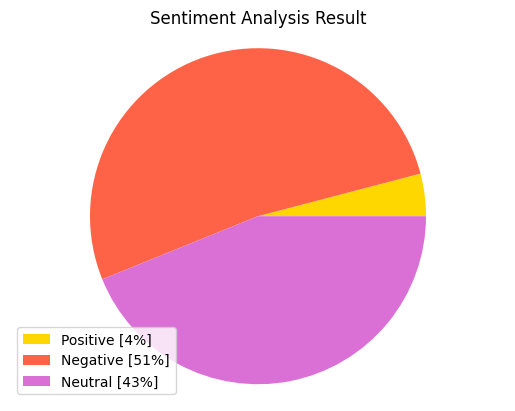

In [ ]:
positive = int(100*len(df_positive)/len(df))
negative = int(100*len(df_negative)/len(df))
neutral = int(100*len(df_neutral)/len(df))

labels = [f'Positive [{str(positive)}%]', f'Negative [{str(negative)}%]', f'Neutral [{str(neutral)}%]']

sizes = [positive, negative, neutral]
colors = ['gold','tomato','orchid']

patches, texts = plt.pie(sizes,colors=colors)
plt.style.use('default')
plt.legend(labels)
plt.title("Sentiment Analysis Result")
plt.axis("equal")
plt.show()

In [ ]:
tweets_agg_df = df.groupby(["date", "sentiment_label"])["hashtags"].count().reset_index()[0:15]
tweets_agg_df.columns = ["date", "sentiment_label", "count"]
tweets_agg_df

,date,sentiment_label,count
0,2023-02-07,negative,295
1,2023-02-07,neutral,227
2,2023-02-07,positive,13
3,2023-02-08,negative,232
4,2023-02-08,neutral,155
5,2023-02-08,positive,16
6,2023-02-09,negative,335
7,2023-02-09,neutral,304
8,2023-02-09,positive,21
9,2023-02-10,negative,984


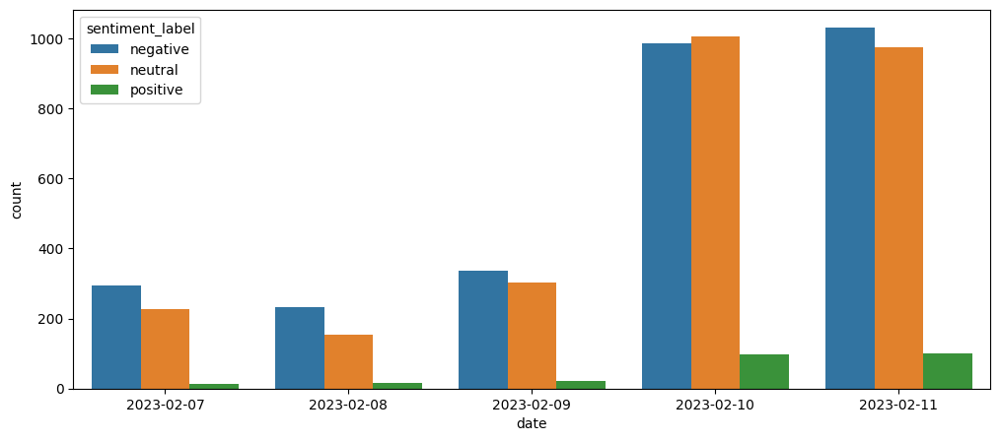

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
sns.barplot(x = 'date', y = 'count', hue = 'sentiment_label', data = tweets_agg_df);

In [ ]:
# turkish stopwords
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
STOPWORDS = set(stopwords.words('turkish'))
print(STOPWORDS)

# adding missing stopwords
STOPWORDS.update(('türkiye','deprem','hiçbir', 'bir', 'the', 'to', 'kadar'))

{'biri', 'daha', 'en', 'gibi', 'nerde', 'kez', 'o', 'bu', 'hep', 'eğer', 'bazı', 'belki', 'kim', 'da', 'çünkü', 'şey', 'ne', 'biz', 'ki', 'siz', 'niye', 'az', 'ya', 'veya', 'için', 'birkaç', 'ise', 'mı', 've', 'mü', 'nereye', 'ama', 'neden', 'nasıl', 'her', 'yani', 'çok', 'ile', 'sanki', 'de', 'nerede', 'niçin', 'defa', 'hepsi', 'birşey', 'mu', 'acaba', 'şu', 'tüm', 'diye', 'aslında', 'hem', 'hiç'}


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
tweet_all_texts = " ".join(t for t in df.text)
print("All tweets consist of {0} words.".format(len(tweet_all_texts)))

All tweets consist of 1814919 words.


In [ ]:
tweet_positive_texts = " ".join(t for t in df_positive.text)
print("All positive tweets consist of {0} words".format(len(tweet_positive_texts)))

All positive tweets consist of 81438 words


In [ ]:
tweet_negative_texts = " ".join(t for t in df_negative.text)
print("All negative tweets consist of {0} words".format(len(tweet_negative_texts)))

All negative tweets consist of 936637 words


In [ ]:
def generate_word_cloud(tweets, status):

    print(len(tweets))

    wordcloud = WordCloud(max_words = 500,
        width=800,
        height=400,
        background_color = 'black',
        stopwords = STOPWORDS).generate(str(tweets))

    plt.figure(figsize=(20,10), facecolor='k')
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

In [ ]:
def generate_word_cloud_from_frequencies(freq_dict, status):

    print(len(fdist_filtered))

    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color = 'black',
        stopwords = STOPWORDS).generate_from_frequencies(frequencies=freq_dict)

    plt.figure(figsize=(20,10), facecolor='k')
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

In [ ]:
token_words = word_tokenize(tweet_all_texts)
print(token_words)
print(len(token_words))

['hi', 'people', 'help', 'would', 'much', 'appreciated', 'quick', 'legit', 'reaction', 'try', 'https', 'co', 'c', 'ogzzap', 'jlo', 'intimissimi', 'turkeyquake', 'desperate', 'please', 'help', 'jennifer', 'love', 'ahbapdernegi', 'hatay', 'afad', 'thank', 'rafael', 'means', 'lot', 'turkeyquake', 'rkiye', 'deprem', 'https', 'co', 'c', 'znbe', 'ws', 'adgpi', 'hey', 'bbcworld', 'try', 'cover', 'stories', 'absolute', 'truth', 'turkeyquake', 'rather', 'making', 'baseless', 'https', 'co', 'nwmawkuw', 'picture', 'day', 'turkeyquake', 'syrianeedshelp', 'helpsyrianpeople', 'earthquakeinsyria', 'isro', 'operationdost', 'https', 'co', 'q', 'hlbcdnkh', 'support', 'affected', 'earthquakes', 'use', 'charity', 'wallet', 'eth', 'xd', 'bd', 'b', 'c', 'daedf', 'ad', 'b', 'ba', 'dd', 'https', 'co', 'kwfkeekp', 'cant', 'believe', 'see', 'turkeysyriaearthquake', 'earthquaketurkey', 'https', 'co', 'qpcyst', 'vl', 'help', 'turkey', 'earthquake', 'disaster', 'occurred', 'turkey', 'urgently', 'lack', 'tent', 'su

In [ ]:
stop_words = STOPWORDS

token_words_clean_ = [w for w in token_words if not w in stop_words and len(w)>1]
print(token_words_clean_)
print(len(token_words_clean_))

['hi', 'people', 'help', 'would', 'much', 'appreciated', 'quick', 'legit', 'reaction', 'try', 'https', 'co', 'ogzzap', 'jlo', 'intimissimi', 'turkeyquake', 'desperate', 'please', 'help', 'jennifer', 'love', 'ahbapdernegi', 'hatay', 'afad', 'thank', 'rafael', 'means', 'lot', 'turkeyquake', 'rkiye', 'https', 'co', 'znbe', 'ws', 'adgpi', 'hey', 'bbcworld', 'try', 'cover', 'stories', 'absolute', 'truth', 'turkeyquake', 'rather', 'making', 'baseless', 'https', 'co', 'nwmawkuw', 'picture', 'day', 'turkeyquake', 'syrianeedshelp', 'helpsyrianpeople', 'earthquakeinsyria', 'isro', 'operationdost', 'https', 'co', 'hlbcdnkh', 'support', 'affected', 'earthquakes', 'use', 'charity', 'wallet', 'eth', 'xd', 'bd', 'daedf', 'ad', 'ba', 'dd', 'https', 'co', 'kwfkeekp', 'cant', 'believe', 'see', 'turkeysyriaearthquake', 'earthquaketurkey', 'https', 'co', 'qpcyst', 'vl', 'help', 'turkey', 'earthquake', 'disaster', 'occurred', 'turkey', 'urgently', 'lack', 'tent', 'support', 'country', 'https', 'co', 'baldu

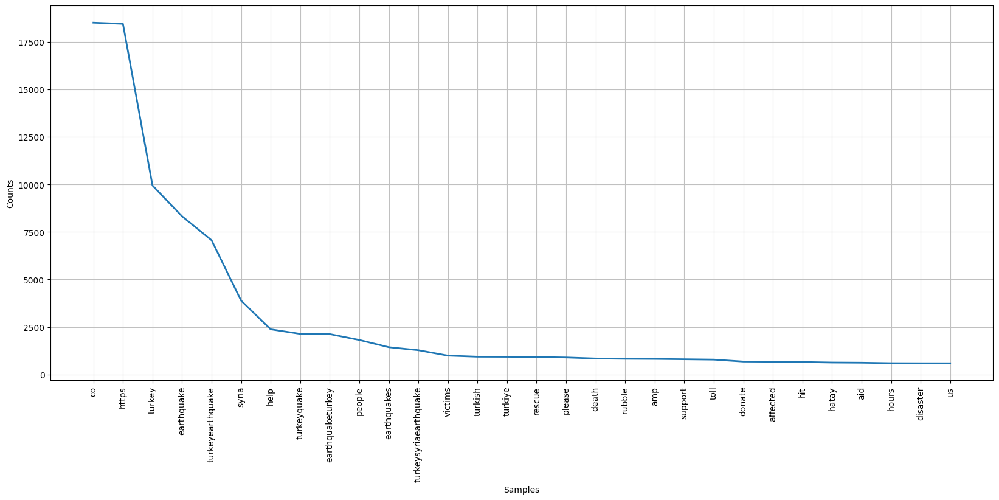

In [ ]:
fdist_filtered = FreqDist(token_words_clean_)
plt.figure(figsize=(20, 8))
fdist_filtered.plot(30);

In [ ]:
from collections import Counter

d = Counter(fdist_filtered)
d.most_common(100)

[('co', 18519),
 ('https', 18457),
 ('turkey', 9949),
 ('earthquake', 8327),
 ('turkeyearthquake', 7066),
 ('syria', 3886),
 ('help', 2378),
 ('turkeyquake', 2138),
 ('earthquaketurkey', 2125),
 ('people', 1817),
 ('earthquakes', 1435),
 ('turkeysyriaearthquake', 1277),
 ('victims', 993),
 ('turkish', 936),
 ('turkiye', 932),
 ('rescue', 919),
 ('please', 895),
 ('death', 842),
 ('rubble', 825),
 ('amp', 818),
 ('support', 801),
 ('toll', 783),
 ('donate', 680),
 ('affected', 671),
 ('hit', 657),
 ('hatay', 629),
 ('aid', 620),
 ('hours', 595),
 ('disaster', 591),
 ('us', 590),
 ('magnitude', 590),
 ('rescued', 581),
 ('earthquakeinturkey', 576),
 ('need', 558),
 ('rkiye', 534),
 ('may', 505),
 ('quake', 505),
 ('relief', 496),
 ('devastating', 474),
 ('lives', 446),
 ('team', 444),
 ('allah', 429),
 ('prayforturkey', 418),
 ('world', 414),
 ('another', 411),
 ('syriaearthquake', 407),
 ('old', 407),
 ('lost', 406),
 ('thank', 398),
 ('th', 388),
 ('one', 385),
 ('two', 382),
 ('new', 

In [ ]:
len(fdist_filtered)

39027

39027


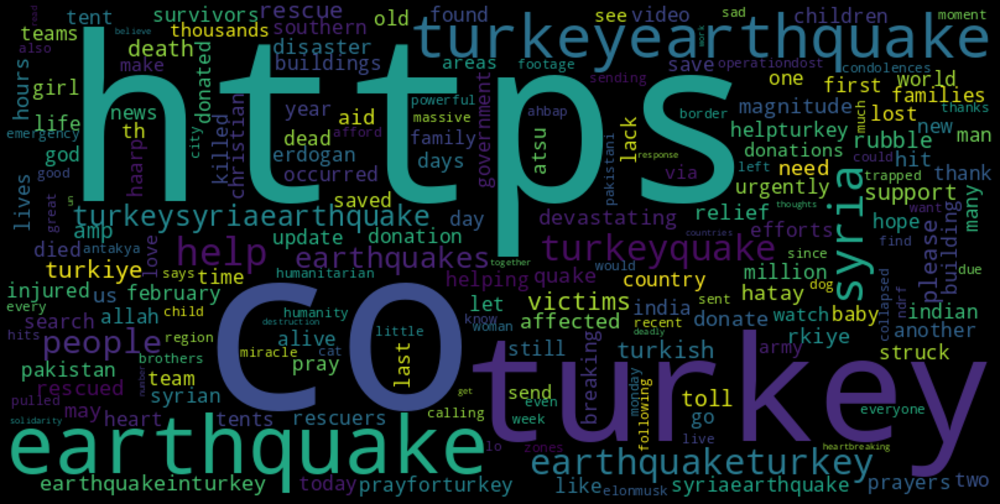

In [ ]:
generate_word_cloud_from_frequencies(fdist_filtered, "all")

In [ ]:
token_positive_words = word_tokenize(tweet_positive_texts)
print(token_positive_words)
print(len(token_positive_words))

['thank', 'bartkowiak', 'already', 'saved', 'life', 'dzi', 'kuj', 'turkeyearthquake', 'andrej', 'poland', 'https', 'co', 'uwozfnbuki', 'thank', 'bartkowiak', 'already', 'saved', 'live', 'dzi', 'kuj', 'turkeyearthquake', 'andrej', 'poland', 'https', 'co', 'nnekx', 'wdem', 'corey', 'feldman', 'thank', 'much', 'information', 'corey', 'definitely', 'gon', 'na', 'look', 'donate', 'https', 'co', 'x', 'eapvocop', 'delighted', 'hear', 'news', 'cristian', 'atsu', 'found', 'safe', 'well', 'nufc', 'earthquaketurkey', 'https', 'co', 'gihmvpjfub', 'first', 'hours', 'critical', 'chances', 'still', 'good', 'upto', 'week', 'solidaritywithturkey', 'earthquaketurkey', 'polish', 'rescue', 'specialists', 'helped', 'save', 'people', 'alive', 'far', 'teams', 'nations', 'working', 'hard', 'th', 'https', 'co', 'xedvjg', 'yxf', 'thank', 'earthquake', 'earthquaketurkey', 'much', 'sadness', 'miracles', 'good', 'luck', 'beautiful', 'princess', 'umay', 'rest', 'life', 'earthquaketurkey', 'https', 'co', 'dq', 'q', 

In [ ]:
print(len(token_positive_words))

11520


In [ ]:
token_positive_words_clean_ = [w for w in token_positive_words if not w in stop_words and len(w)>1]
print(token_positive_words_clean_)
print(len(token_positive_words_clean_))

['thank', 'bartkowiak', 'already', 'saved', 'life', 'dzi', 'kuj', 'turkeyearthquake', 'andrej', 'poland', 'https', 'co', 'uwozfnbuki', 'thank', 'bartkowiak', 'already', 'saved', 'live', 'dzi', 'kuj', 'turkeyearthquake', 'andrej', 'poland', 'https', 'co', 'nnekx', 'wdem', 'corey', 'feldman', 'thank', 'much', 'information', 'corey', 'definitely', 'gon', 'na', 'look', 'donate', 'https', 'co', 'eapvocop', 'delighted', 'hear', 'news', 'cristian', 'atsu', 'found', 'safe', 'well', 'nufc', 'earthquaketurkey', 'https', 'co', 'gihmvpjfub', 'first', 'hours', 'critical', 'chances', 'still', 'good', 'upto', 'week', 'solidaritywithturkey', 'earthquaketurkey', 'polish', 'rescue', 'specialists', 'helped', 'save', 'people', 'alive', 'far', 'teams', 'nations', 'working', 'hard', 'th', 'https', 'co', 'xedvjg', 'yxf', 'thank', 'earthquake', 'earthquaketurkey', 'much', 'sadness', 'miracles', 'good', 'luck', 'beautiful', 'princess', 'umay', 'rest', 'life', 'earthquaketurkey', 'https', 'co', 'dq', 'kqd', 'no

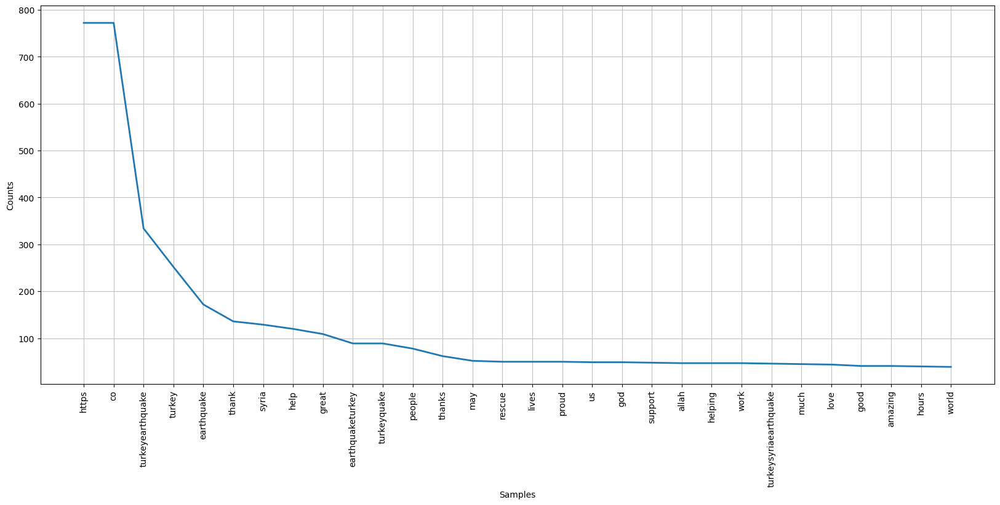

In [ ]:
fdist_filtered_positive = FreqDist(token_positive_words_clean_)  # kelime listesini gruplayıp saymak için bir kütüphane
plt.figure(figsize=(20, 8))
fdist_filtered_positive.plot(30);

In [ ]:
generate_word_cloud_from_frequencies(fdist_filtered_positive, "positive")

In [ ]:
token_negative_words = word_tokenize(tweet_negative_texts)
print(token_negative_words)
print(len(token_negative_words))

['jlo', 'intimissimi', 'turkeyquake', 'desperate', 'please', 'help', 'jennifer', 'love', 'ahbapdernegi', 'hatay', 'afad', 'adgpi', 'hey', 'bbcworld', 'try', 'cover', 'stories', 'absolute', 'truth', 'turkeyquake', 'rather', 'making', 'baseless', 'https', 'co', 'nwmawkuw', 'picture', 'day', 'turkeyquake', 'syrianeedshelp', 'helpsyrianpeople', 'earthquakeinsyria', 'isro', 'operationdost', 'https', 'co', 'q', 'hlbcdnkh', 'cant', 'believe', 'see', 'turkeysyriaearthquake', 'earthquaketurkey', 'https', 'co', 'qpcyst', 'vl', 'help', 'turkey', 'earthquake', 'disaster', 'occurred', 'turkey', 'urgently', 'lack', 'tent', 'support', 'country', 'https', 'co', 'baldufy', 'k', 'help', 'turkey', 'earthquake', 'disaster', 'occurred', 'turkey', 'urgently', 'lack', 'tent', 'support', 'country', 'plea', 'https', 'co', 'jbud', 'eb', 'crypt', 'rom', 'cobratate', 'help', 'turkey', 'earthquake', 'disaster', 'occurred', 'turkey', 'urgently', 'lack', 'tent', 'support', 'https', 'co', 'gmddjhohc', 'cobratate', 'h

In [ ]:
token_negative_words_clean_ = [w for w in token_negative_words if not w in stop_words and len(w)>1]
print(token_negative_words_clean_)
print(len(token_negative_words_clean_))

['jlo', 'intimissimi', 'turkeyquake', 'desperate', 'please', 'help', 'jennifer', 'love', 'ahbapdernegi', 'hatay', 'afad', 'adgpi', 'hey', 'bbcworld', 'try', 'cover', 'stories', 'absolute', 'truth', 'turkeyquake', 'rather', 'making', 'baseless', 'https', 'co', 'nwmawkuw', 'picture', 'day', 'turkeyquake', 'syrianeedshelp', 'helpsyrianpeople', 'earthquakeinsyria', 'isro', 'operationdost', 'https', 'co', 'hlbcdnkh', 'cant', 'believe', 'see', 'turkeysyriaearthquake', 'earthquaketurkey', 'https', 'co', 'qpcyst', 'vl', 'help', 'turkey', 'earthquake', 'disaster', 'occurred', 'turkey', 'urgently', 'lack', 'tent', 'support', 'country', 'https', 'co', 'baldufy', 'help', 'turkey', 'earthquake', 'disaster', 'occurred', 'turkey', 'urgently', 'lack', 'tent', 'support', 'country', 'plea', 'https', 'co', 'jbud', 'eb', 'crypt', 'rom', 'cobratate', 'help', 'turkey', 'earthquake', 'disaster', 'occurred', 'turkey', 'urgently', 'lack', 'tent', 'support', 'https', 'co', 'gmddjhohc', 'cobratate', 'help', 'tur

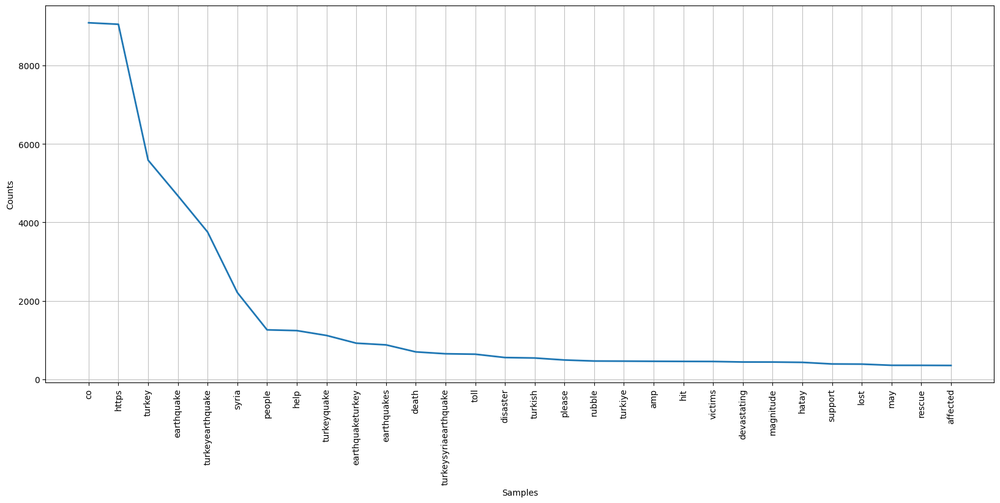

In [ ]:
fdist_filtered_negative = FreqDist(token_negative_words_clean_)
plt.figure(figsize=(20, 8))
fdist_filtered_negative.plot(30);

In [ ]:
d = Counter(fdist_filtered_negative)
d.most_common(100)

[('co', 9091),
 ('https', 9053),
 ('turkey', 5587),
 ('earthquake', 4680),
 ('turkeyearthquake', 3754),
 ('syria', 2211),
 ('people', 1259),
 ('help', 1240),
 ('turkeyquake', 1116),
 ('earthquaketurkey', 919),
 ('earthquakes', 876),
 ('death', 697),
 ('turkeysyriaearthquake', 649),
 ('toll', 638),
 ('disaster', 553),
 ('turkish', 541),
 ('please', 490),
 ('rubble', 464),
 ('turkiye', 461),
 ('amp', 457),
 ('hit', 454),
 ('victims', 452),
 ('devastating', 439),
 ('magnitude', 438),
 ('hatay', 430),
 ('support', 389),
 ('lost', 385),
 ('may', 355),
 ('rescue', 354),
 ('affected', 351),
 ('dead', 333),
 ('quake', 332),
 ('earthquakeinturkey', 324),
 ('another', 304),
 ('lives', 303),
 ('need', 297),
 ('country', 292),
 ('allah', 288),
 ('two', 263),
 ('occurred', 262),
 ('rkiye', 257),
 ('us', 250),
 ('urgently', 247),
 ('lack', 245),
 ('tent', 244),
 ('prayforturkey', 241),
 ('struck', 236),
 ('new', 216),
 ('died', 211),
 ('killed', 207),
 ('helpturkey', 206),
 ('news', 205),
 ('one', 2

39027


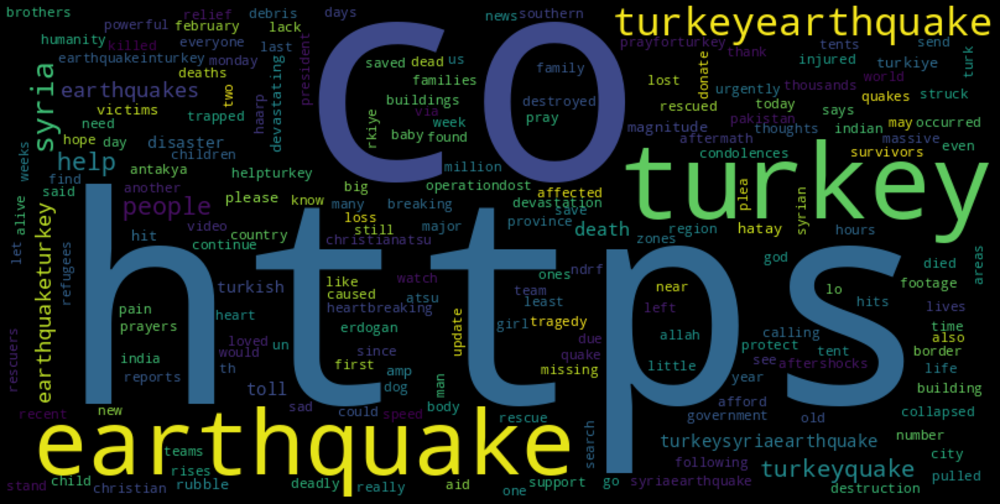

In [ ]:
generate_word_cloud_from_frequencies(fdist_filtered_negative, "negative")

In [ ]:
# Save the processed text to a text file
processed_text_filename = 'processed_tweets.txt'

def remove_patterns_from_text(text):
    for pattern in remove_patterns:
        text = re.sub(r'\b' + re.escape(pattern) + r'\b', '', text)
    return text.strip()

df['text'] = df['text'].apply(remove_patterns_from_text)
df['text'].to_csv(processed_text_filename, index=False, header=False)

# Display the first few lines of the processed text
with open(processed_text_filename, 'r') as file:
    processed_text_sample = [next(file).strip() for _ in range(5)]
    print(processed_text_sample)


['hi people help would much appreciated quick legit reaction try', 'jlo intimissimi turkeyquake desperate please help jennifer love ahbapdernegi hatay afad', 'thank rafael means lot turkeyquake rkiye deprem', 'adgpi hey bbcworld try cover stories absolute truth turkeyquake rather making baseless', 'picture day turkeyquake syrianeedshelp helpsyrianpeople earthquakeinsyria isro operationdost']
